# Crop Yield Prediction:

# Data Wrangling :

• Perform essential data wrangling tasks, including handling missing values, duplicates,
and outliers. Use appropriate techniques in Python (pandas) to ensure data
cleanliness.


The First Step is to Gather Data and then this raw as I work on Crop Yeild Production Data and it consist of 4 sub-datasets,
which I further convet or merge into one by doing Data Cleaning and Data Wrangling.Here the steps below

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
dataset_yield= pd.read_csv('yield.csv')
dataset_rainfall =pd.read_csv('rainfall.csv')
dataset_pesticides = pd.read_csv('pesticides.csv')
dataset_temp=pd.read_csv('temp.csv')

In [ ]:
display(dataset_yield)
display(dataset_rainfall)
display(dataset_pesticides)
display(dataset_temp)

,Domain Code,Domain,Area Code,Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,Value
0,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1961,1961,hg/ha,14000
1,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1962,1962,hg/ha,14000
2,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1963,1963,hg/ha,14260
3,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1964,1964,hg/ha,14257
4,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1965,1965,hg/ha,14400
...,...,...,...,...,...,...,...,...,...,...,...,...
56712,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2012,2012,hg/ha,24420
56713,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2013,2013,hg/ha,22888
56714,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2014,2014,hg/ha,21357
56715,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2015,2015,hg/ha,19826


,Area,Year,average_rain_fall_mm_per_year
0,Afghanistan,1985,327
1,Afghanistan,1986,327
2,Afghanistan,1987,327
3,Afghanistan,1989,327
4,Afghanistan,1990,327
...,...,...,...
6722,Zimbabwe,2013,657
6723,Zimbabwe,2014,657
6724,Zimbabwe,2015,657
6725,Zimbabwe,2016,657


,Domain,Area,Element,Item,Year,Unit,Value
0,Pesticides Use,Albania,Use,Pesticides (total),1990,tonnes of active ingredients,121.00
1,Pesticides Use,Albania,Use,Pesticides (total),1991,tonnes of active ingredients,121.00
2,Pesticides Use,Albania,Use,Pesticides (total),1992,tonnes of active ingredients,121.00
3,Pesticides Use,Albania,Use,Pesticides (total),1993,tonnes of active ingredients,121.00
4,Pesticides Use,Albania,Use,Pesticides (total),1994,tonnes of active ingredients,201.00
...,...,...,...,...,...,...,...
4344,Pesticides Use,Zimbabwe,Use,Pesticides (total),2012,tonnes of active ingredients,3375.53
4345,Pesticides Use,Zimbabwe,Use,Pesticides (total),2013,tonnes of active ingredients,2550.07
4346,Pesticides Use,Zimbabwe,Use,Pesticides (total),2014,tonnes of active ingredients,2185.07
4347,Pesticides Use,Zimbabwe,Use,Pesticides (total),2015,tonnes of active ingredients,2185.07


,year,country,avg_temp
0,1849,Côte D'Ivoire,25.58
1,1850,Côte D'Ivoire,25.52
2,1851,Côte D'Ivoire,25.67
3,1852,Côte D'Ivoire,NaN
4,1853,Côte D'Ivoire,NaN
...,...,...,...
71306,2009,Mexico,21.76
71307,2010,Mexico,20.90
71308,2011,Mexico,21.55
71309,2012,Mexico,21.52


This is Frist Step to check the common column in all four dataset and to rename them So, Merging could be possible

In [ ]:
dataset_yield = dataset_yield.rename(index=str, columns={"Value": "hg/ha_yield"})
dataset_rainfall = dataset_rainfall.rename(index=str, columns={" Area": 'Area'})
dataset_rainfall['average_rain_fall_mm_per_year'] = pd.to_numeric(dataset_rainfall['average_rain_fall_mm_per_year'],errors = 'coerce')
dataset_pesticides = dataset_pesticides.rename(index=str, columns={"Value": "pesticides_tonnes"})
dataset_temp = dataset_temp.rename(index=str, columns={"year": "Year", "country":'Area'})
display(dataset_yield)
display(dataset_rainfall)
display(dataset_pesticides)
display(dataset_temp)

,Domain Code,Domain,Area Code,Area,Element Code,Element,Item Code,Item,Year Code,Year,Unit,hg/ha_yield
0,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1961,1961,hg/ha,14000
1,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1962,1962,hg/ha,14000
2,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1963,1963,hg/ha,14260
3,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1964,1964,hg/ha,14257
4,QC,Crops,2,Afghanistan,5419,Yield,56,Maize,1965,1965,hg/ha,14400
...,...,...,...,...,...,...,...,...,...,...,...,...
56712,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2012,2012,hg/ha,24420
56713,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2013,2013,hg/ha,22888
56714,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2014,2014,hg/ha,21357
56715,QC,Crops,181,Zimbabwe,5419,Yield,15,Wheat,2015,2015,hg/ha,19826


,Area,Year,average_rain_fall_mm_per_year
0,Afghanistan,1985,327.0
1,Afghanistan,1986,327.0
2,Afghanistan,1987,327.0
3,Afghanistan,1989,327.0
4,Afghanistan,1990,327.0
...,...,...,...
6722,Zimbabwe,2013,657.0
6723,Zimbabwe,2014,657.0
6724,Zimbabwe,2015,657.0
6725,Zimbabwe,2016,657.0


,Domain,Area,Element,Item,Year,Unit,pesticides_tonnes
0,Pesticides Use,Albania,Use,Pesticides (total),1990,tonnes of active ingredients,121.00
1,Pesticides Use,Albania,Use,Pesticides (total),1991,tonnes of active ingredients,121.00
2,Pesticides Use,Albania,Use,Pesticides (total),1992,tonnes of active ingredients,121.00
3,Pesticides Use,Albania,Use,Pesticides (total),1993,tonnes of active ingredients,121.00
4,Pesticides Use,Albania,Use,Pesticides (total),1994,tonnes of active ingredients,201.00
...,...,...,...,...,...,...,...
4344,Pesticides Use,Zimbabwe,Use,Pesticides (total),2012,tonnes of active ingredients,3375.53
4345,Pesticides Use,Zimbabwe,Use,Pesticides (total),2013,tonnes of active ingredients,2550.07
4346,Pesticides Use,Zimbabwe,Use,Pesticides (total),2014,tonnes of active ingredients,2185.07
4347,Pesticides Use,Zimbabwe,Use,Pesticides (total),2015,tonnes of active ingredients,2185.07


,Year,Area,avg_temp
0,1849,Côte D'Ivoire,25.58
1,1850,Côte D'Ivoire,25.52
2,1851,Côte D'Ivoire,25.67
3,1852,Côte D'Ivoire,NaN
4,1853,Côte D'Ivoire,NaN
...,...,...,...
71306,2009,Mexico,21.76
71307,2010,Mexico,20.90
71308,2011,Mexico,21.55
71309,2012,Mexico,21.52


After examming the dataset the columns which do not have any affect on crop yeilds and also those column which are usless
being dropped in the section.In This section the subdataset of temp have some null values which is also filled based to mean .

In [ ]:
columns_to_drop = ['Year Code', 'Element Code', 'Element', 'Year Code', 'Area Code', 'Domain Code', 'Domain', 'Unit', 'Item Code']
dataset_yield = dataset_yield.drop(columns=columns_to_drop, errors='ignore')
dataset_pesticides = dataset_pesticides.drop(['Element','Domain','Unit','Item'], axis=1)
dataset_rainfall = dataset_rainfall.dropna()
dataset_temp['avg_temp'] = dataset_temp['avg_temp'].fillna(dataset_temp['avg_temp'].mean())
display(dataset_yield)
display(dataset_rainfall)
display(dataset_pesticides)
display(dataset_temp)

,Area,Item,Year,hg/ha_yield
0,Afghanistan,Maize,1961,14000
1,Afghanistan,Maize,1962,14000
2,Afghanistan,Maize,1963,14260
3,Afghanistan,Maize,1964,14257
4,Afghanistan,Maize,1965,14400
...,...,...,...,...
56712,Zimbabwe,Wheat,2012,24420
56713,Zimbabwe,Wheat,2013,22888
56714,Zimbabwe,Wheat,2014,21357
56715,Zimbabwe,Wheat,2015,19826


,Area,Year,average_rain_fall_mm_per_year
0,Afghanistan,1985,327.0
1,Afghanistan,1986,327.0
2,Afghanistan,1987,327.0
3,Afghanistan,1989,327.0
4,Afghanistan,1990,327.0
...,...,...,...
6722,Zimbabwe,2013,657.0
6723,Zimbabwe,2014,657.0
6724,Zimbabwe,2015,657.0
6725,Zimbabwe,2016,657.0


,Area,Year,pesticides_tonnes
0,Albania,1990,121.00
1,Albania,1991,121.00
2,Albania,1992,121.00
3,Albania,1993,121.00
4,Albania,1994,201.00
...,...,...,...
4344,Zimbabwe,2012,3375.53
4345,Zimbabwe,2013,2550.07
4346,Zimbabwe,2014,2185.07
4347,Zimbabwe,2015,2185.07


,Year,Area,avg_temp
0,1849,Côte D'Ivoire,25.580000
1,1850,Côte D'Ivoire,25.520000
2,1851,Côte D'Ivoire,25.670000
3,1852,Côte D'Ivoire,16.183876
4,1853,Côte D'Ivoire,16.183876
...,...,...,...
71306,2009,Mexico,21.760000
71307,2010,Mexico,20.900000
71308,2011,Mexico,21.550000
71309,2012,Mexico,21.520000


After all the steps now the dataset is finally ready to be merged and after merging the full and final dataset is yield_dataset

In [ ]:
yield_dataset = pd.merge(dataset_yield, dataset_rainfall, on=['Year','Area'])
yield_dataset = pd.merge(yield_dataset, dataset_pesticides, on=['Year','Area'])
yield_dataset = pd.merge(yield_dataset,dataset_temp, on=['Area','Year'])
display(yield_dataset)

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
0,Albania,Maize,1990,36613,1485.0,121.00,16.37
1,Albania,Potatoes,1990,66667,1485.0,121.00,16.37
2,Albania,"Rice, paddy",1990,23333,1485.0,121.00,16.37
3,Albania,Sorghum,1990,12500,1485.0,121.00,16.37
4,Albania,Soybeans,1990,7000,1485.0,121.00,16.37
...,...,...,...,...,...,...,...
28237,Zimbabwe,"Rice, paddy",2013,22581,657.0,2550.07,19.76
28238,Zimbabwe,Sorghum,2013,3066,657.0,2550.07,19.76
28239,Zimbabwe,Soybeans,2013,13142,657.0,2550.07,19.76
28240,Zimbabwe,Sweet potatoes,2013,22222,657.0,2550.07,19.76


To Check null values in my dataset and there is no null values .

In [ ]:
yield_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 28242 entries, 0 to 28241
Data columns (total 7 columns):
 #   Column                         Non-Null Count  Dtype  
---  ------                         --------------  -----  
 0   Area                           28242 non-null  object 
 1   Item                           28242 non-null  object 
 2   Year                           28242 non-null  int64  
 3   hg/ha_yield                    28242 non-null  int64  
 4   average_rain_fall_mm_per_year  28242 non-null  float64
 5   pesticides_tonnes              28242 non-null  float64
 6   avg_temp                       28242 non-null  float64
dtypes: float64(3), int64(2), object(2)
memory usage: 1.5+ MB


In [ ]:
yield_dataset.describe()

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp
count,28242.000000,28242.000000,28242.00000,28242.000000,28242.000000
mean,2001.544296,77053.332094,1149.05598,37076.909344,20.542627
std,7.051905,84956.612897,709.81215,59958.784665,6.312051
min,1990.000000,50.000000,51.00000,0.040000,1.300000
25%,1995.000000,19919.250000,593.00000,1702.000000,16.702500
50%,2001.000000,38295.000000,1083.00000,17529.440000,21.510000
75%,2008.000000,104676.750000,1668.00000,48687.880000,26.000000
max,2013.000000,501412.000000,3240.00000,367778.000000,30.650000


In [ ]:
yield_dataset['Item'].value_counts()

Item
Potatoes                4276
Maize                   4121
Wheat                   3857
Rice, paddy             3388
Soybeans                3223
Sorghum                 3039
Sweet potatoes          2890
Cassava                 2045
Yams                     847
Plantains and others     556
Name: count, dtype: int64

In [ ]:
yield_dataset.groupby(['Area'], sort = True)[['hg/ha_yield']].sum().nlargest(10, 'hg/ha_yield')

,hg/ha_yield
Area,
India,327420324
Brazil,167550306
Mexico,130788528
Japan,124470912
Australia,109111062
Pakistan,73897434
Indonesia,69193506
United Kingdom,55419990
Turkey,52263950


In [ ]:
yield_dataset.groupby(['Item','Area'], sort = True)['hg/ha_yield'].sum().nlargest(10)

Item            Area          
Cassava         India             142810624
Potatoes        India              92122514
                Brazil             49602168
                United Kingdom     46705145
                Australia          45670386
Sweet potatoes  India              44439538
Potatoes        Japan              42918726
                Mexico             42053880
Sweet potatoes  Mexico             35808592
                Australia          35550294
Name: hg/ha_yield, dtype: int64

To check duplication in rows and there is not duplication in dataset now .

In [ ]:
duplicate_rows = yield_dataset[yield_dataset.duplicated()]

# Display duplicate rows
print("Duplicate Rows except first occurrence:")
print(duplicate_rows)

Duplicate Rows except first occurrence:
                 Area            Item  Year  hg/ha_yield  \
2083       Bangladesh           Maize  1990        10015   
2085       Bangladesh        Potatoes  1990        91410   
2087       Bangladesh     Rice, paddy  1990        25661   
2089       Bangladesh         Sorghum  1990         8103   
2091       Bangladesh  Sweet potatoes  1990        98316   
...               ...             ...   ...          ...   
27690  United Kingdom           Wheat  2011        77471   
27695  United Kingdom        Potatoes  2012       305570   
27700  United Kingdom           Wheat  2012        66571   
27705  United Kingdom        Potatoes  2013       408993   
27710  United Kingdom           Wheat  2013        73838   

       average_rain_fall_mm_per_year  pesticides_tonnes  avg_temp  
2083                          2666.0            1266.00     25.98  
2085                          2666.0            1266.00     25.98  
2087                          2666.

To check outliers using Z-score in this .

In [ ]:
from scipy.stats import zscore

# Assuming your dataset is stored in a DataFrame named 'df'
numerical_columns = ['hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp']

# Calculate Z-scores
z_scores = pd.DataFrame(zscore(yield_dataset[numerical_columns]), columns=numerical_columns)

# Print rows with Z-scores greater than 3 or less than -3
outliers = yield_dataset[(z_scores > 3) | (z_scores < -3)]
print("Rows with outliers:")
print(outliers)

Rows with outliers:
      Area Item  Year  hg/ha_yield  average_rain_fall_mm_per_year  \
0      NaN  NaN   NaN          NaN                            NaN   
1      NaN  NaN   NaN          NaN                            NaN   
2      NaN  NaN   NaN          NaN                            NaN   
3      NaN  NaN   NaN          NaN                            NaN   
4      NaN  NaN   NaN          NaN                            NaN   
...    ...  ...   ...          ...                            ...   
28237  NaN  NaN   NaN          NaN                            NaN   
28238  NaN  NaN   NaN          NaN                            NaN   
28239  NaN  NaN   NaN          NaN                            NaN   
28240  NaN  NaN   NaN          NaN                            NaN   
28241  NaN  NaN   NaN          NaN                            NaN   

       pesticides_tonnes  avg_temp  
0                    NaN       NaN  
1                    NaN       NaN  
2                    NaN       NaN  
3  

# Feature understanding and Visualization:

Now from here feature understading start which shows us the relationships among feautres ,Which feautres is affecting other
feature and what is distribution among features.My Dataset is like this so After cleaniing i have to do visualization to know more
about final feautres that are present in my dataset and how they behave .
NOTE: My Dataset do not have any outliers but in plotting there is hg/ha_yield and pesticides_toones have outliers but these
    these outliers have affect on my prediction so I am not removing them .Every data from both columns is required to make correct
    prediction.

This is the histogram of every features present in yield_dataset.These plot shows differnt distribution some shows normal ,some unifrom ,
some data is rightly skewed and some is left skewed based on the columns.

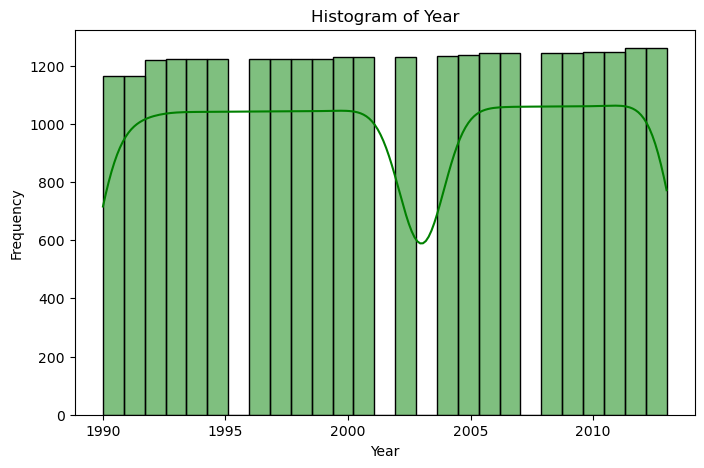

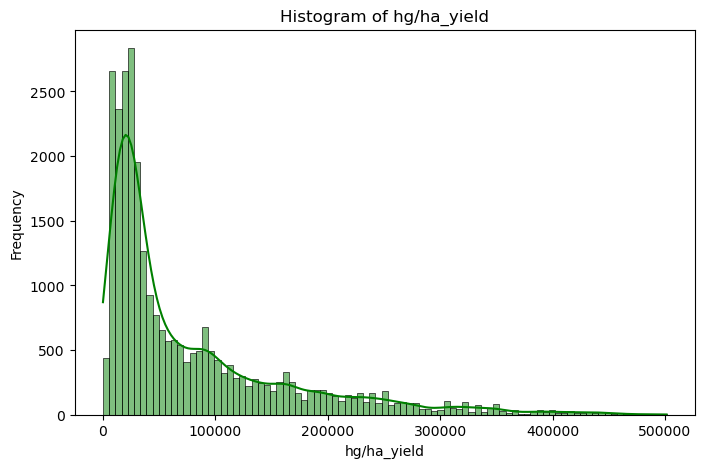

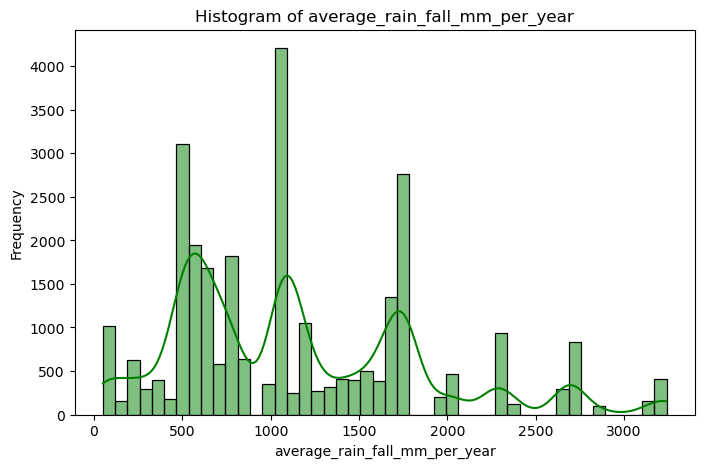

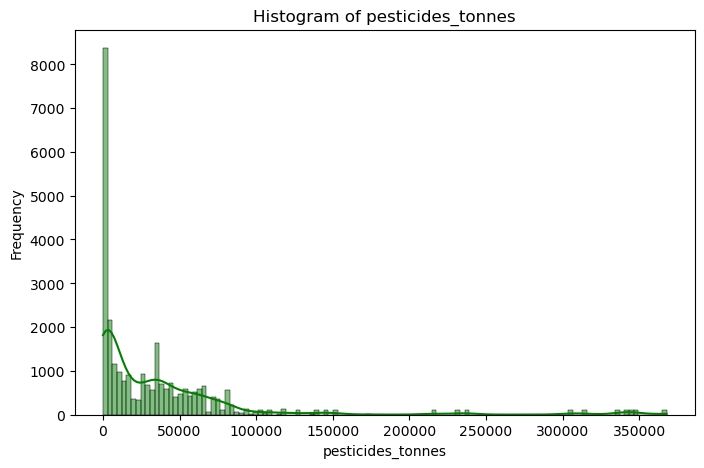

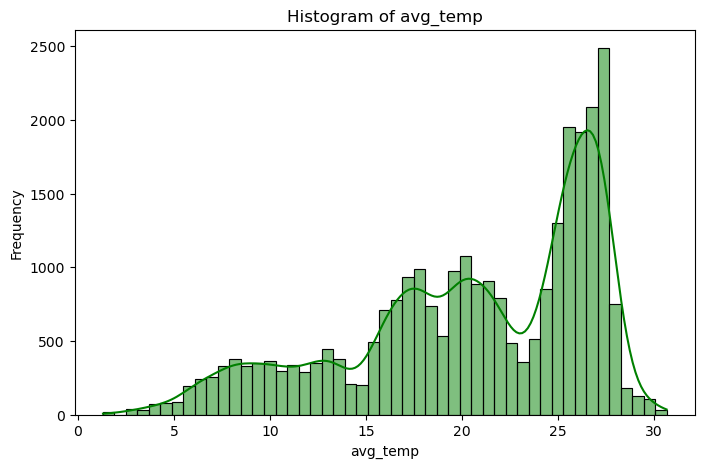

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


# Select numerical columns for plotting
numerical_columns = yield_dataset.select_dtypes(include=['float64', 'int64']).columns

# Plot histograms for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(8, 5))
    sns.histplot(yield_dataset[column], kde=True, color='green')
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

This is the box plot of the feautres present in Dataset.

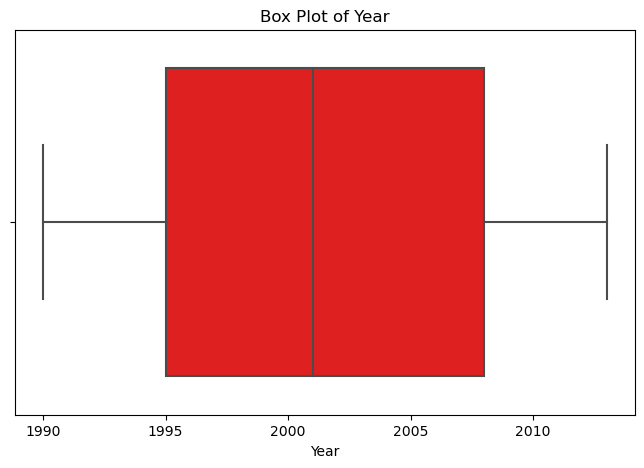

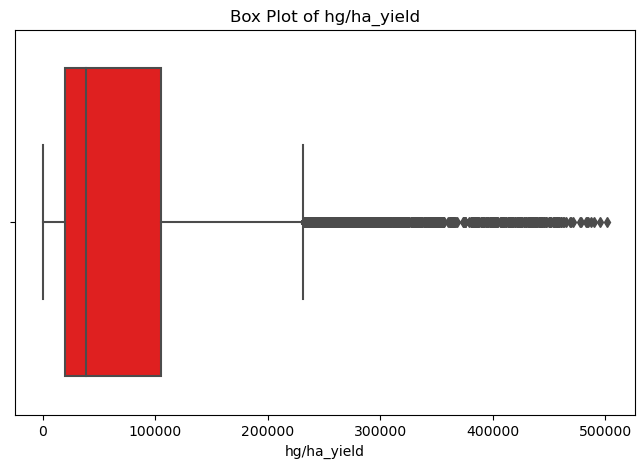

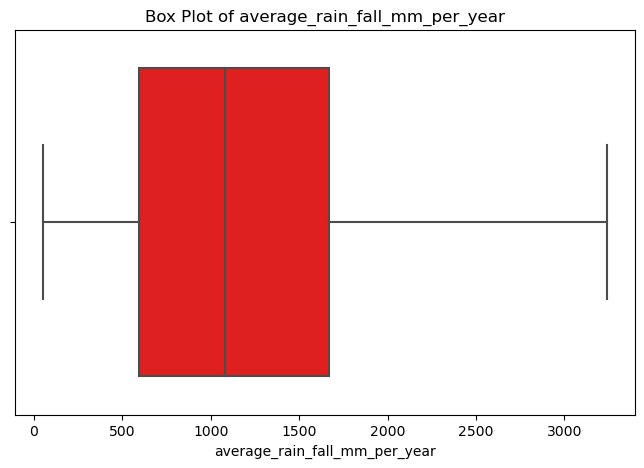

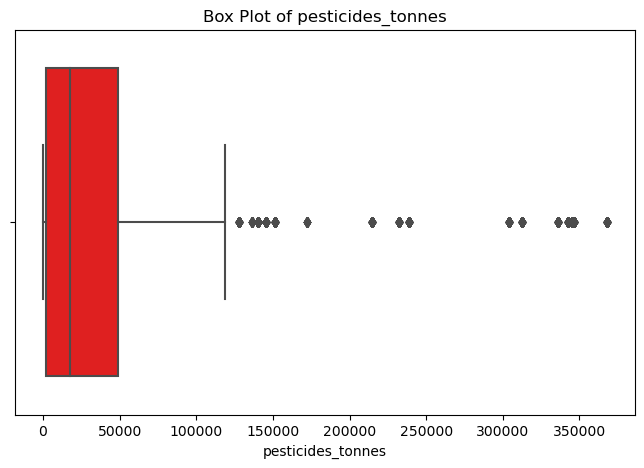

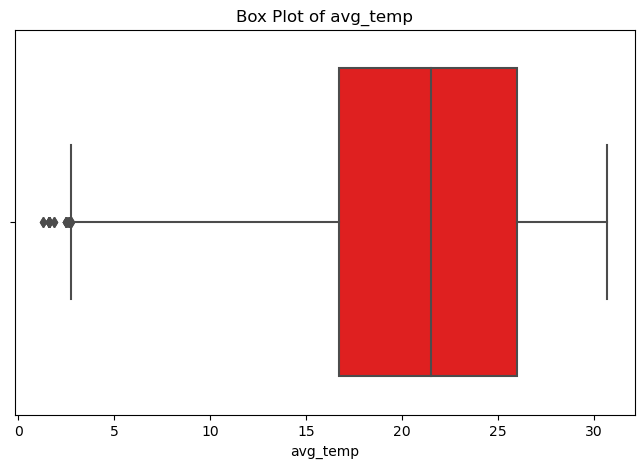

In [ ]:
# Select numerical columns for plotting
numerical_columns = yield_dataset.select_dtypes(include=['float64', 'int64']).columns

# Create box plots for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(8, 5))
    sns.boxplot(x=yield_dataset[column], color='red')
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)
    plt.show()

Density plot for all the feautres in Dataset.

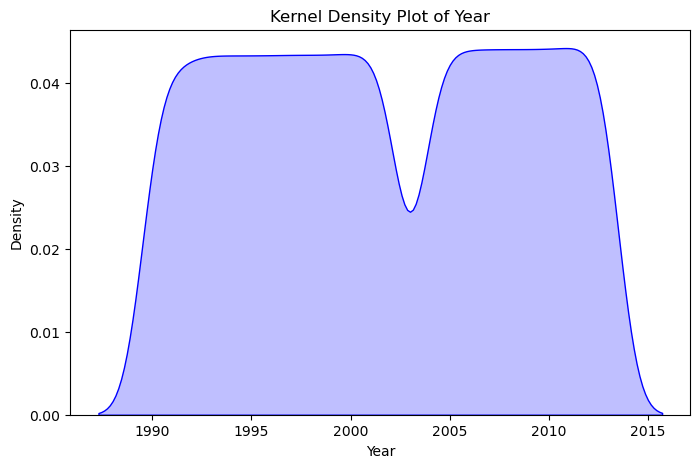

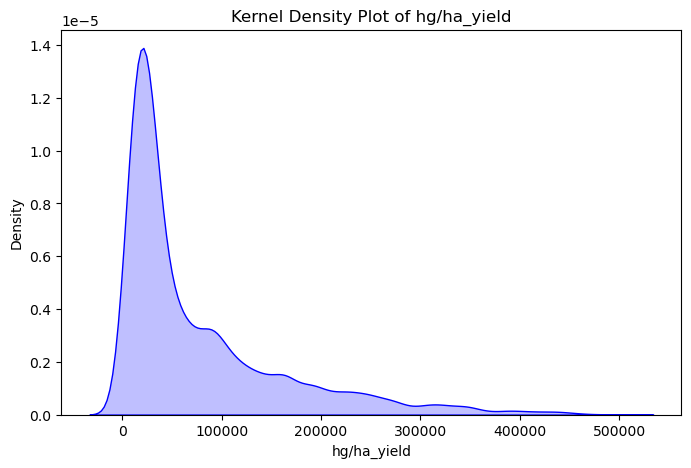

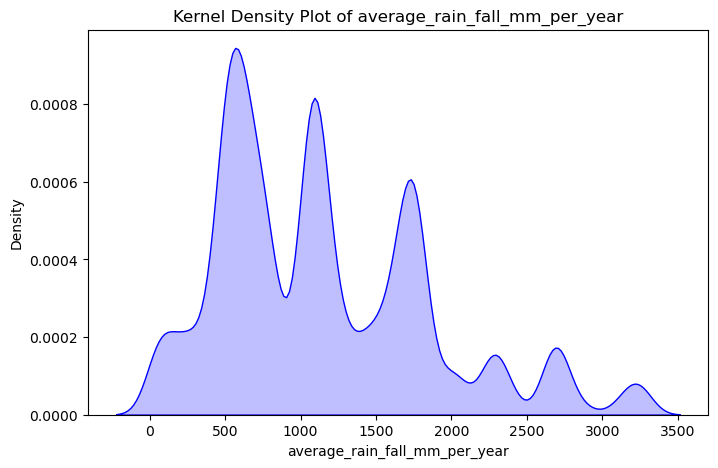

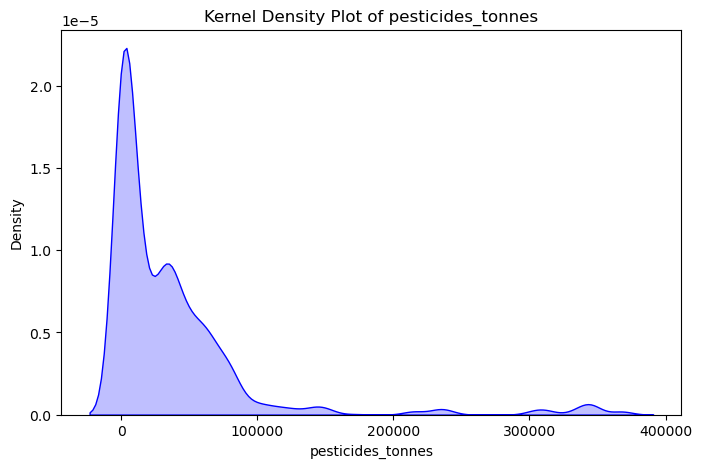

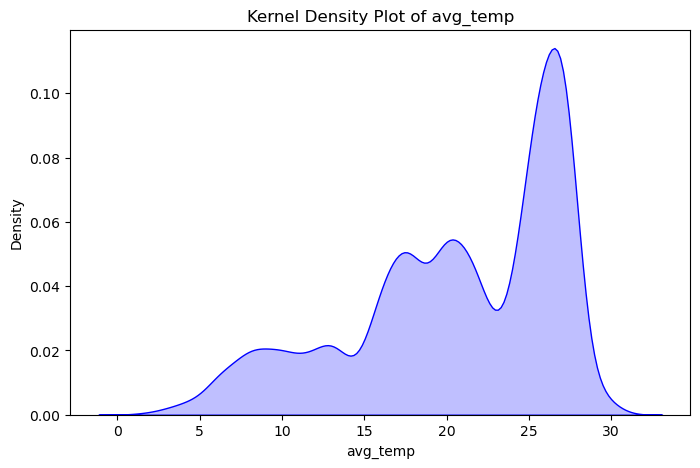

In [ ]:
# Select numerical columns for plotting
numerical_columns = yield_dataset.select_dtypes(include=['float64', 'int64']).columns

# Create kernel density plots for each numerical column
for column in numerical_columns:
    plt.figure(figsize=(8, 5))
    sns.kdeplot(yield_dataset[column], fill=True, color='blue')
    plt.title(f'Kernel Density Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Density')
    plt.show()

Scatter plot of all the feautres and their relationship among them.

C:\Users\Hasham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


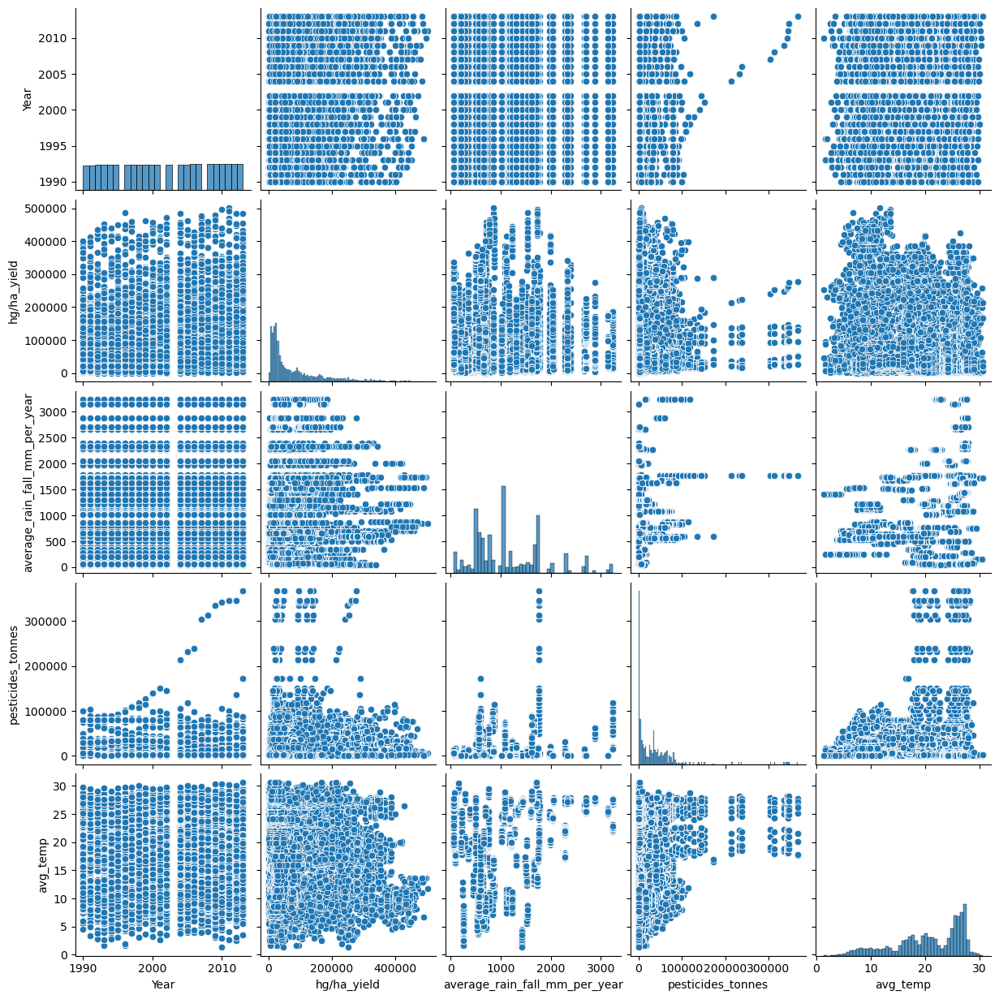

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


# Select numerical columns for pair plotting
numerical_columns = yield_dataset.select_dtypes(include=['float64', 'int64']).columns

# Create pair plots
sns.pairplot(yield_dataset[numerical_columns])
plt.show()

The three main columns in this dataset is HG/HA_yeild ,pesticides_tonnes and rainfall so This is correlation matrix and
scatter plot among them .

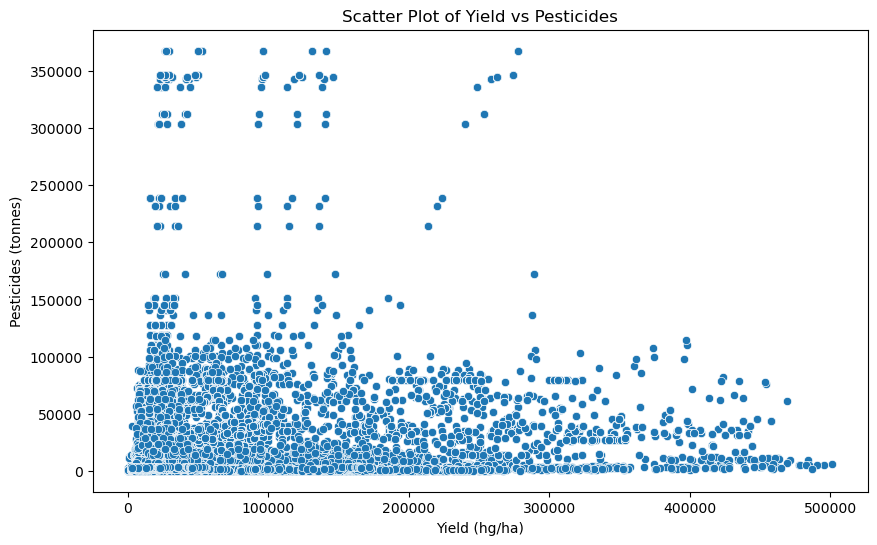

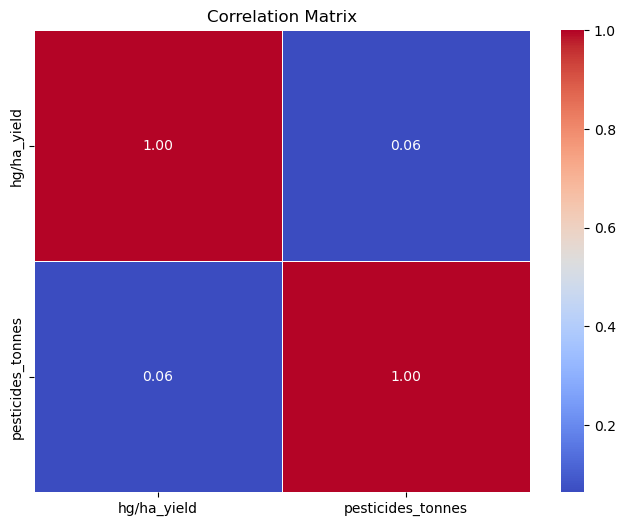

In [ ]:
# Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='hg/ha_yield', y='pesticides_tonnes', data=yield_dataset)
plt.title('Scatter Plot of Yield vs Pesticides')
plt.xlabel('Yield (hg/ha)')
plt.ylabel('Pesticides (tonnes)')
plt.show()

columns_of_interest = ['hg/ha_yield', 'pesticides_tonnes']
correlation_matrix = yield_dataset[columns_of_interest].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()


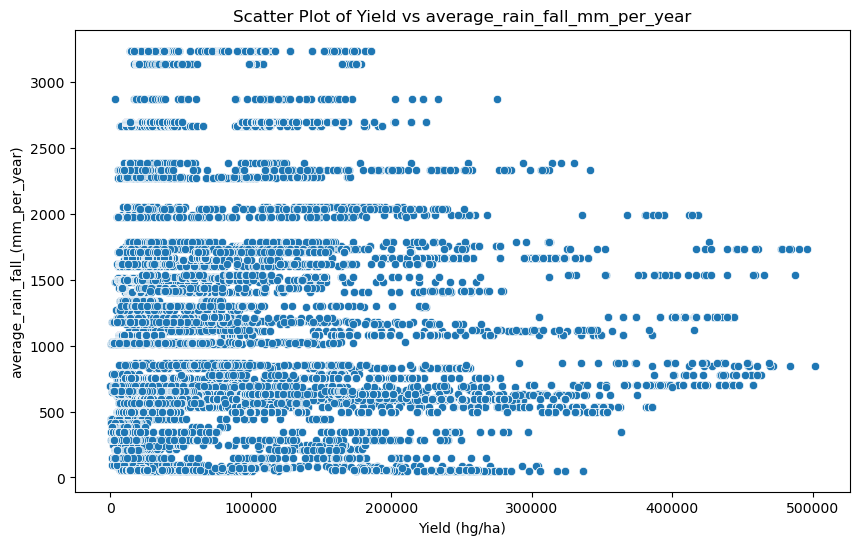

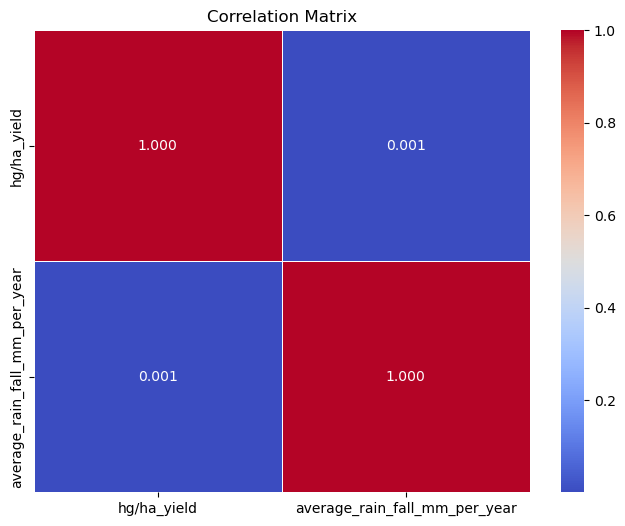

In [ ]:
# Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='hg/ha_yield', y='average_rain_fall_mm_per_year', data=yield_dataset)
plt.title('Scatter Plot of Yield vs average_rain_fall_mm_per_year')
plt.xlabel('Yield (hg/ha)')
plt.ylabel('average_rain_fall_(mm_per_year)')
plt.show()

columns_of_interest = ['hg/ha_yield', 'average_rain_fall_mm_per_year']
correlation_matrix = yield_dataset[columns_of_interest].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".3f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()


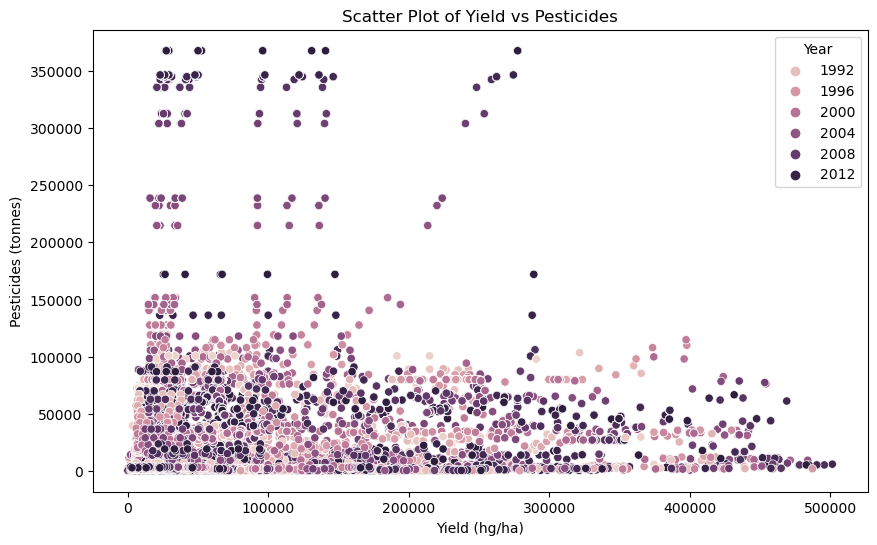

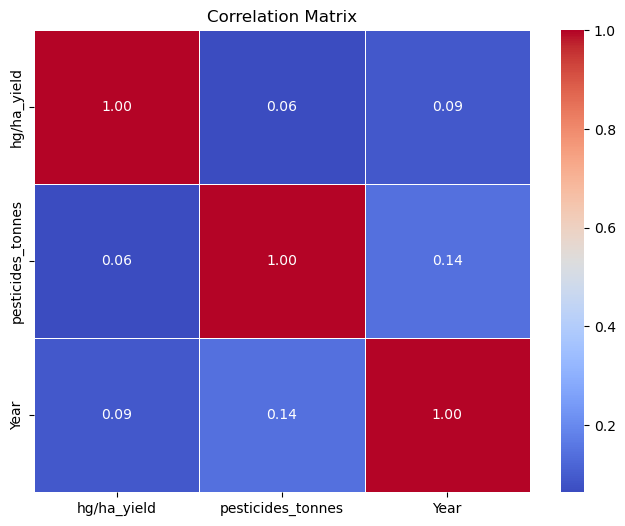

In [ ]:
# Scatter Plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x='hg/ha_yield', y='pesticides_tonnes', hue='Year', data=yield_dataset)
plt.title('Scatter Plot of Yield vs Pesticides')
plt.xlabel('Yield (hg/ha)')
plt.ylabel('Pesticides (tonnes)')
plt.legend(title='Year')
plt.show()

# Correlation Matrix for selected columns including 'Year'
columns_of_interest = ['hg/ha_yield', 'pesticides_tonnes', 'Year']
correlation_matrix = yield_dataset[columns_of_interest].corr()

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

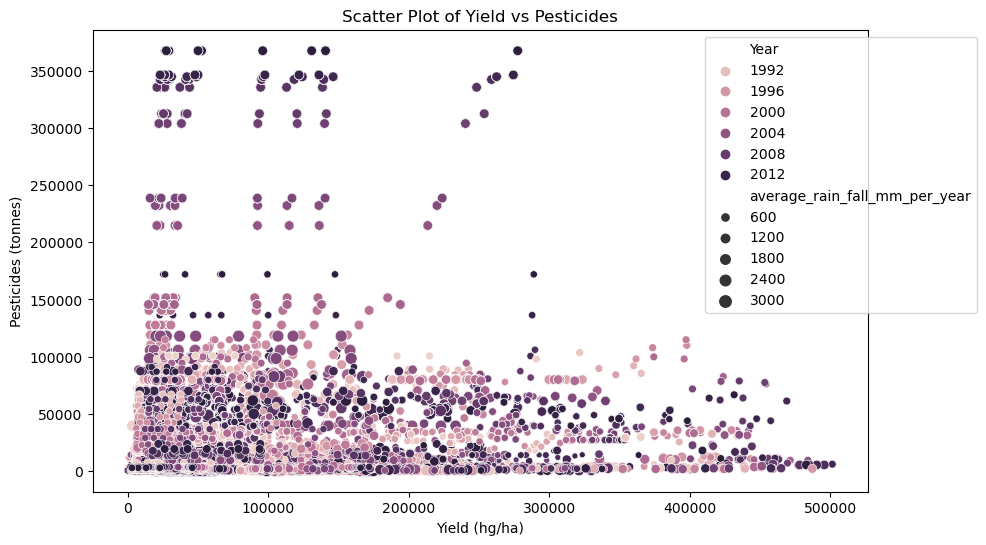

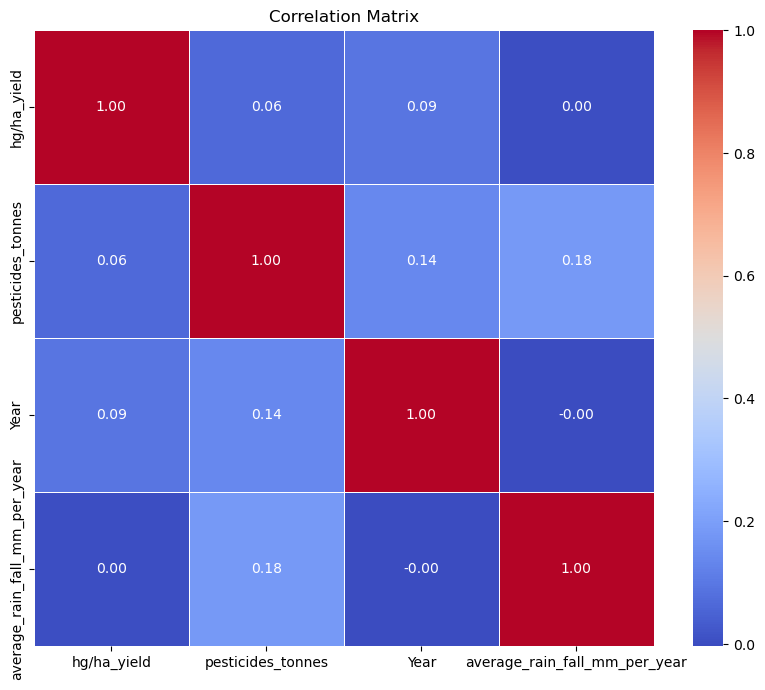

In [ ]:
# Scatter Plot
plt.figure(figsize=(10, 6))
scatter_plot = sns.scatterplot(x='hg/ha_yield', y='pesticides_tonnes', hue='Year', size='average_rain_fall_mm_per_year', data=yield_dataset)
plt.title('Scatter Plot of Yield vs Pesticides')
plt.xlabel('Yield (hg/ha)')
plt.ylabel('Pesticides (tonnes)')
plt.legend(title='Year')
# Adjust legend position
scatter_plot.legend(loc='upper right', bbox_to_anchor=(1.15, 1))
plt.show()

# Correlation Matrix for selected columns including 'Year' and 'average_rain_fall_mm_per_year'
columns_of_interest = ['hg/ha_yield', 'pesticides_tonnes', 'Year', 'average_rain_fall_mm_per_year']
correlation_matrix = yield_dataset[columns_of_interest].corr()

plt.figure(figsize=(10, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation Matrix')
plt.show()

C:\Users\Hasham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


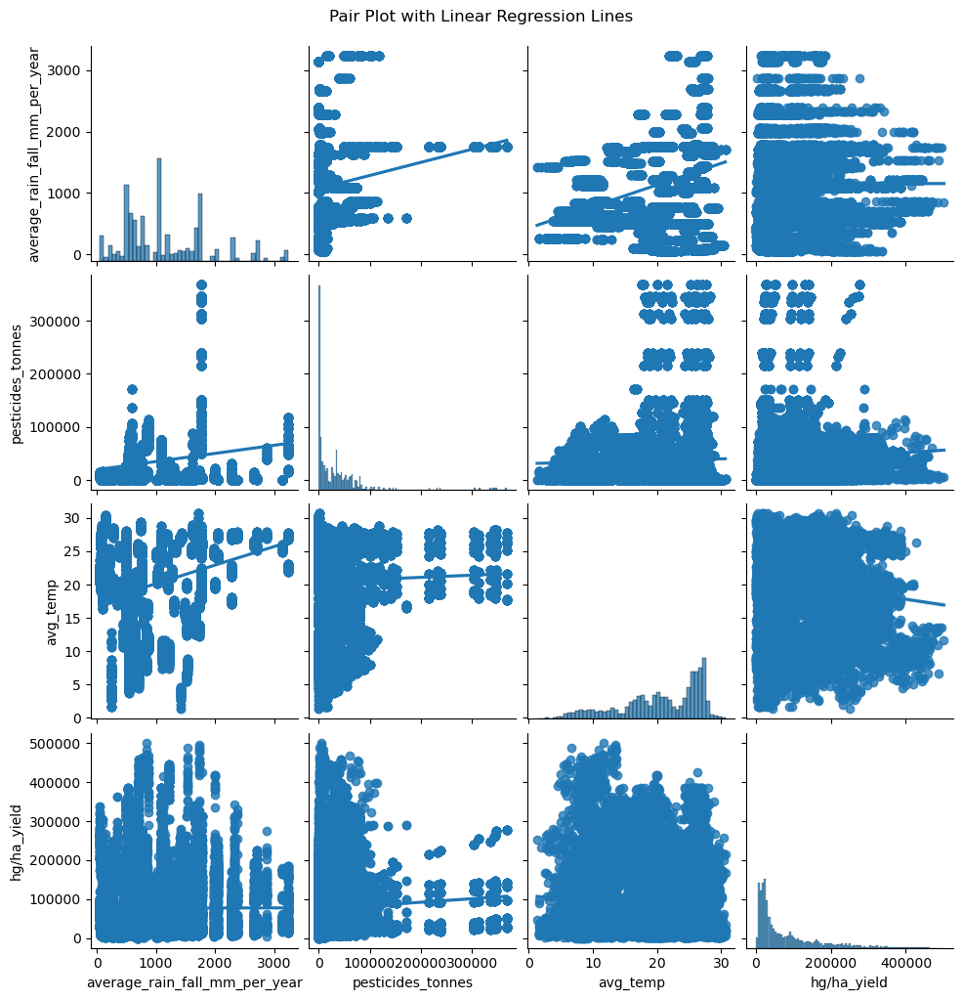

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Select the features for the pair plot
features_pair_plot = [
    'average_rain_fall_mm_per_year',
    'pesticides_tonnes',
    'avg_temp',
    'hg/ha_yield',
]

# Create a pair plot
sns.pairplot(yield_dataset[features_pair_plot], kind='reg')
plt.suptitle('Pair Plot with Linear Regression Lines', y=1.02)
plt.show()

C:\Users\Hasham\anaconda3\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


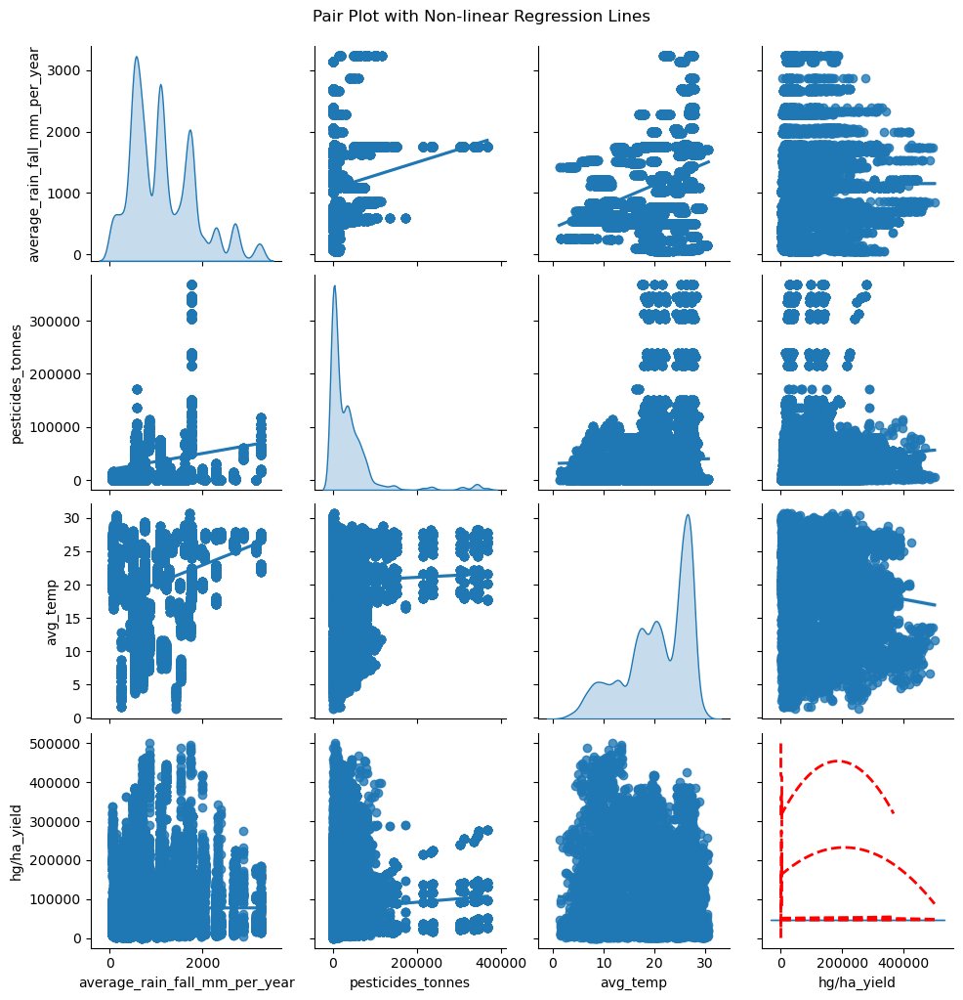

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression

# Select the features for the pair plot
features_pair_plot = [
    'average_rain_fall_mm_per_year',
    'pesticides_tonnes',
    'avg_temp',
    'hg/ha_yield',
]

# Create a pair plot with non-linear regression lines
sns.pairplot(yield_dataset[features_pair_plot], kind='reg', diag_kind='kde')

# Fit non-linear regression lines (polynomial of degree 2)
for feature_x in features_pair_plot:
    for feature_y in features_pair_plot:
        if feature_x != feature_y:
            x = yield_dataset[feature_x]
            y = yield_dataset[feature_y]

            # Fit a polynomial regression model
            poly = PolynomialFeatures(degree=2)
            X_poly = poly.fit_transform(x.values.reshape(-1, 1))
            model = LinearRegression().fit(X_poly, y)

            # Predict using the model
            x_pred = np.linspace(x.min(), x.max(), 100)
            X_pred_poly = poly.transform(x_pred.reshape(-1, 1))
            y_pred = model.predict(X_pred_poly)

            # Plot the non-linear regression line
            plt.plot(x_pred, y_pred, color='red', linestyle='--', linewidth=2)

plt.suptitle('Pair Plot with Non-linear Regression Lines', y=1.02)
plt.show()

In [ ]:
import plotly.express as px


fig = px.scatter(yield_dataset, x='hg/ha_yield', y='pesticides_tonnes', color='Area', template='plotly_dark', title='Scatter Plot of Yield vs Pesticides')
fig.update_layout(xaxis_title='Yield (hg/ha)', yaxis_title='Pesticides (tonnes)')

# Show the plot
fig.show()

In [ ]:
import plotly.express as px

# Assuming 'yield_dataset' is your DataFrame
fig_rainfall_item = px.scatter(yield_dataset, x='average_rain_fall_mm_per_year', y='hg/ha_yield', color='Item', template='plotly_dark', title='Scatter Plot of Rainfall vs Yield')
fig_rainfall_item.update_layout(xaxis_title='Average Rainfall (mm per year)', yaxis_title='Yield (hg/ha)')

# Show the plot
fig_rainfall_item.show()

In [ ]:
import plotly.express as px

# Assuming 'yield_dataset' is your DataFrame
fig_rainfall_yield_area_item = px.scatter(yield_dataset, x='average_rain_fall_mm_per_year', y='hg/ha_yield', color='Area', symbol='Item', template='plotly_dark', title='Scatter Plot of Rainfall vs Yield by Area and Item')
fig_rainfall_yield_area_item.update_layout(xaxis_title='Average Rainfall (mm per year)', yaxis_title='Yield (hg/ha)')

# Show the plot
fig_rainfall_yield_area_item.show()

# Feature Engineering :

The first step of feature engineering is to add new columns or feautes in your data which will enhance your prediction values of
your ML model So,In this step I add some extra feautres like create differnet bins (low,high,modrate,etc) for rainfall and also
create dummies or list all the crops and Area as in binray values Which is True or False .So the model prediction is more accurate.

In [ ]:

yield_dataset['Rainfall_Category'] = pd.cut(yield_dataset['average_rain_fall_mm_per_year'], bins=[0, 500, 1000, 1500, float('inf')], labels=['Low', 'Moderate', 'High', 'Very High'])

In [ ]:
display(yield_dataset)

,Area,Item,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Rainfall_Category
0,Albania,Maize,1990,36613,1485.0,121.00,16.37,High
1,Albania,Potatoes,1990,66667,1485.0,121.00,16.37,High
2,Albania,"Rice, paddy",1990,23333,1485.0,121.00,16.37,High
3,Albania,Sorghum,1990,12500,1485.0,121.00,16.37,High
4,Albania,Soybeans,1990,7000,1485.0,121.00,16.37,High
...,...,...,...,...,...,...,...,...
28237,Zimbabwe,"Rice, paddy",2013,22581,657.0,2550.07,19.76,Moderate
28238,Zimbabwe,Sorghum,2013,3066,657.0,2550.07,19.76,Moderate
28239,Zimbabwe,Soybeans,2013,13142,657.0,2550.07,19.76,Moderate
28240,Zimbabwe,Sweet potatoes,2013,22222,657.0,2550.07,19.76,Moderate


One-Hot Encoding is used Here For crops to covnert this categorical data:

In [ ]:
yield_dataset = pd.get_dummies(yield_dataset, columns=['Item'], prefix='Crop')

In [ ]:
display(yield_dataset)

,Area,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Rainfall_Category,Crop_Cassava,Crop_Maize,Crop_Plantains and others,Crop_Potatoes,"Crop_Rice, paddy",Crop_Sorghum,Crop_Soybeans,Crop_Sweet potatoes,Crop_Wheat,Crop_Yams
0,Albania,1990,36613,1485.0,121.00,16.37,High,False,True,False,False,False,False,False,False,False,False
1,Albania,1990,66667,1485.0,121.00,16.37,High,False,False,False,True,False,False,False,False,False,False
2,Albania,1990,23333,1485.0,121.00,16.37,High,False,False,False,False,True,False,False,False,False,False
3,Albania,1990,12500,1485.0,121.00,16.37,High,False,False,False,False,False,True,False,False,False,False
4,Albania,1990,7000,1485.0,121.00,16.37,High,False,False,False,False,False,False,True,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28237,Zimbabwe,2013,22581,657.0,2550.07,19.76,Moderate,False,False,False,False,True,False,False,False,False,False
28238,Zimbabwe,2013,3066,657.0,2550.07,19.76,Moderate,False,False,False,False,False,True,False,False,False,False
28239,Zimbabwe,2013,13142,657.0,2550.07,19.76,Moderate,False,False,False,False,False,False,True,False,False,False
28240,Zimbabwe,2013,22222,657.0,2550.07,19.76,Moderate,False,False,False,False,False,False,False,True,False,False


One-Hot Encoding to Covert Categorical Data to Binary Form is used here for Rainfall Category and Area:

In [ ]:
df = pd.get_dummies(yield_dataset, columns=['Rainfall_Category'])
df = pd.get_dummies(df, columns=['Area'])

In [ ]:
display(df)

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Crop_Cassava,Crop_Maize,Crop_Plantains and others,Crop_Potatoes,"Crop_Rice, paddy",...,Area_Tajikistan,Area_Thailand,Area_Tunisia,Area_Turkey,Area_Uganda,Area_Ukraine,Area_United Kingdom,Area_Uruguay,Area_Zambia,Area_Zimbabwe
0,1990,36613,1485.0,121.00,16.37,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1990,66667,1485.0,121.00,16.37,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
2,1990,23333,1485.0,121.00,16.37,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
3,1990,12500,1485.0,121.00,16.37,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,1990,7000,1485.0,121.00,16.37,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28237,2013,22581,657.0,2550.07,19.76,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,True
28238,2013,3066,657.0,2550.07,19.76,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
28239,2013,13142,657.0,2550.07,19.76,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
28240,2013,22222,657.0,2550.07,19.76,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


Min-Max Scaling is used to 4 columns whose values are random to take these values and place in boundry of 0 and 1 so to make
easy for the model to predict.

In [ ]:
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()
df[['hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp']] = scaler.fit_transform(yield_dataset[['hg/ha_yield', 'average_rain_fall_mm_per_year', 'pesticides_tonnes', 'avg_temp']])

In [ ]:
display(df)

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Crop_Cassava,Crop_Maize,Crop_Plantains and others,Crop_Potatoes,"Crop_Rice, paddy",...,Area_Tajikistan,Area_Thailand,Area_Tunisia,Area_Turkey,Area_Uganda,Area_Ukraine,Area_United Kingdom,Area_Uruguay,Area_Zambia,Area_Zimbabwe
0,1990,0.072927,0.449671,0.000329,0.513458,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,1990,0.132872,0.449671,0.000329,0.513458,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,False
2,1990,0.046439,0.449671,0.000329,0.513458,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,False
3,1990,0.024832,0.449671,0.000329,0.513458,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,1990,0.013862,0.449671,0.000329,0.513458,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28237,2013,0.044940,0.190028,0.006934,0.628961,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,True
28238,2013,0.006016,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
28239,2013,0.026113,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True
28240,2013,0.044224,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,True


In [ ]:
df['rainfall_temp_interaction'] = df['average_rain_fall_mm_per_year'] * df['avg_temp']

In [ ]:
display(df)

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Crop_Cassava,Crop_Maize,Crop_Plantains and others,Crop_Potatoes,"Crop_Rice, paddy",...,Area_Thailand,Area_Tunisia,Area_Turkey,Area_Uganda,Area_Ukraine,Area_United Kingdom,Area_Uruguay,Area_Zambia,Area_Zimbabwe,rainfall_temp_interaction
0,1990,0.072927,0.449671,0.000329,0.513458,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,0.230887
1,1990,0.132872,0.449671,0.000329,0.513458,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,0.230887
2,1990,0.046439,0.449671,0.000329,0.513458,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,0.230887
3,1990,0.024832,0.449671,0.000329,0.513458,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0.230887
4,1990,0.013862,0.449671,0.000329,0.513458,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0.230887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28237,2013,0.044940,0.190028,0.006934,0.628961,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,0.119520
28238,2013,0.006016,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,0.119520
28239,2013,0.026113,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,0.119520
28240,2013,0.044224,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,0.119520


In [ ]:
scaler_year = MinMaxScaler()
df['Year'] = scaler_year.fit_transform(df[['Year']])

This is the final Form of dataset after every operation on it now its ready to go through ML model.

In [ ]:
display(df)

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,Crop_Cassava,Crop_Maize,Crop_Plantains and others,Crop_Potatoes,"Crop_Rice, paddy",...,Area_Thailand,Area_Tunisia,Area_Turkey,Area_Uganda,Area_Ukraine,Area_United Kingdom,Area_Uruguay,Area_Zambia,Area_Zimbabwe,rainfall_temp_interaction
0,0.0,0.072927,0.449671,0.000329,0.513458,False,True,False,False,False,...,False,False,False,False,False,False,False,False,False,0.230887
1,0.0,0.132872,0.449671,0.000329,0.513458,False,False,False,True,False,...,False,False,False,False,False,False,False,False,False,0.230887
2,0.0,0.046439,0.449671,0.000329,0.513458,False,False,False,False,True,...,False,False,False,False,False,False,False,False,False,0.230887
3,0.0,0.024832,0.449671,0.000329,0.513458,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0.230887
4,0.0,0.013862,0.449671,0.000329,0.513458,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,0.230887
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28237,1.0,0.044940,0.190028,0.006934,0.628961,False,False,False,False,True,...,False,False,False,False,False,False,False,False,True,0.119520
28238,1.0,0.006016,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,0.119520
28239,1.0,0.026113,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,0.119520
28240,1.0,0.044224,0.190028,0.006934,0.628961,False,False,False,False,False,...,False,False,False,False,False,False,False,False,True,0.119520


# Assignment 3:

# Machine Learning Techniques Selection and Justification:

Justification is also given below with ML techniques:

1.Nature of  my dataset:

As I have a dataset which have both Numerical and Catagorical values and also My project is to predict yeild of crops based
on these feautres like average rainfall,temp ,what are effect of pesticides So, these all things tell me that this is supervised regression problem since the target is continuous variable.

2.Data Understanding Like Exploration More of a Way:

The second most important step before applying Machine Learning model is basically understand patterns and exploring dataset
which i already done in the data Feature Understanding ,By Plots I know the relationships between different features and their
impact on the target variable which is yield and what is distribution of targeted vairable yield.

3. Model Selection:

a. Linear Regression:
I choose Linear Regression because My targeted variable is a Regression Problem  
Linear regression is a good starting point for regression problems.
Whey I use it : if you check plots above  there is a linear relationship between the features like temp,rainfall
,pesticides So, they do have effect on crop yield.

b. Decision Trees or Random Forest:
Decision trees and random forests handle non-linear relationships well and can capture complex interactions between features.
and In my Dataset Yield do have non-linear Relationship which some features So, It best to use Random Forest or Decision Tree.
Why I use it:  Because the relationships in  dataset are non-linear  have complex patterns.
One More Reason to use Random Forest or Decision tree is because Decision Trees and Random Forests are generally
robust to outliers in the data, which can be important in agricultural datasets where extreme weather conditions
or other anomalies may affect crop yield.

c. Gradient Boosting (e.g., XGBoost or LightGBM):
Gradient boosting models are powerful and can handle complex relationships  becuase Their are some Complex Relationship between
Yield and some other features and in Predition the more accuracy the more reliable and efficent the model is so for this I use
this model.
Why I use it: Because My dataset can also become large based on Client Requirement So, when the time comes the model is good for
handling large values and perform well for accuracy.

4.Feature Engineering:

This is also Crucial Step of ML algorithms as it enhance the Prediction Power of model and I have already applied it in the above
code as the part of Data Mining Process ,The added features are crop and areas are all added as new feautres and also Rainfall_
temp Interaction .

5.Cross Validation:


It is also a important step for Ml Model as it enchace the model performance and also to check model performs well on differnet
data and not overfitting or underfitting them.I will try to use it in my Model as well.

6. Scaling:

It is also used in Ml Algorithm for more stable and effective result and I will scale my features .

7.Evalution Matrix:

As My ML model are predicting continuous varibale i.e yield production so it best to use regression matrix for mean squared
error,etc.


# Pipeline Explanation:

The steps of ML pipeline is given below:

# Feature Engineering:

I already use feature Engineering in my Dataset introduce new feature like rainfall_temp interaction,split the existing feauture
and apply one hot encoding on them .Basically all step already done to increase model effiecey that are related to Feature Engin
eering .

The one more step we can do is to covert all the boolean values into 0 and 1 .

In [ ]:
# Convert True/False to 1/0 for all boolean columns
df_boolean = df.select_dtypes(include=['bool']).astype(int)

# Drop the original boolean columns from the DataFrame
df = df.drop(df_boolean.columns, axis=1)

# Concatenate the converted boolean columns to the DataFrame
df = pd.concat([df, df_boolean], axis=1)

In [ ]:
display(df)

,Year,hg/ha_yield,average_rain_fall_mm_per_year,pesticides_tonnes,avg_temp,rainfall_temp_interaction,Crop_Cassava,Crop_Maize,Crop_Plantains and others,Crop_Potatoes,...,Area_Tajikistan,Area_Thailand,Area_Tunisia,Area_Turkey,Area_Uganda,Area_Ukraine,Area_United Kingdom,Area_Uruguay,Area_Zambia,Area_Zimbabwe
0,0.0,0.072927,0.449671,0.000329,0.513458,0.230887,0,1,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0.0,0.132872,0.449671,0.000329,0.513458,0.230887,0,0,0,1,...,0,0,0,0,0,0,0,0,0,0
2,0.0,0.046439,0.449671,0.000329,0.513458,0.230887,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,0.0,0.024832,0.449671,0.000329,0.513458,0.230887,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0.0,0.013862,0.449671,0.000329,0.513458,0.230887,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
28237,1.0,0.044940,0.190028,0.006934,0.628961,0.119520,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
28238,1.0,0.006016,0.190028,0.006934,0.628961,0.119520,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
28239,1.0,0.026113,0.190028,0.006934,0.628961,0.119520,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1
28240,1.0,0.044224,0.190028,0.006934,0.628961,0.119520,0,0,0,0,...,0,0,0,0,0,0,0,0,0,1


# Data Preprocessing:

Missing Values:

As you can see there are no missing values in my dataset so it's good to go

Missing Values Count in Each Column:
Area                             0
Year                             0
hg/ha_yield                      0
average_rain_fall_mm_per_year    0
pesticides_tonnes                0
avg_temp                         0
Rainfall_Category                0
Crop_Cassava                     0
Crop_Maize                       0
Crop_Plantains and others        0
Crop_Potatoes                    0
Crop_Rice, paddy                 0
Crop_Sorghum                     0
Crop_Soybeans                    0
Crop_Sweet potatoes              0
Crop_Wheat                       0
Crop_Yams                        0
dtype: int64


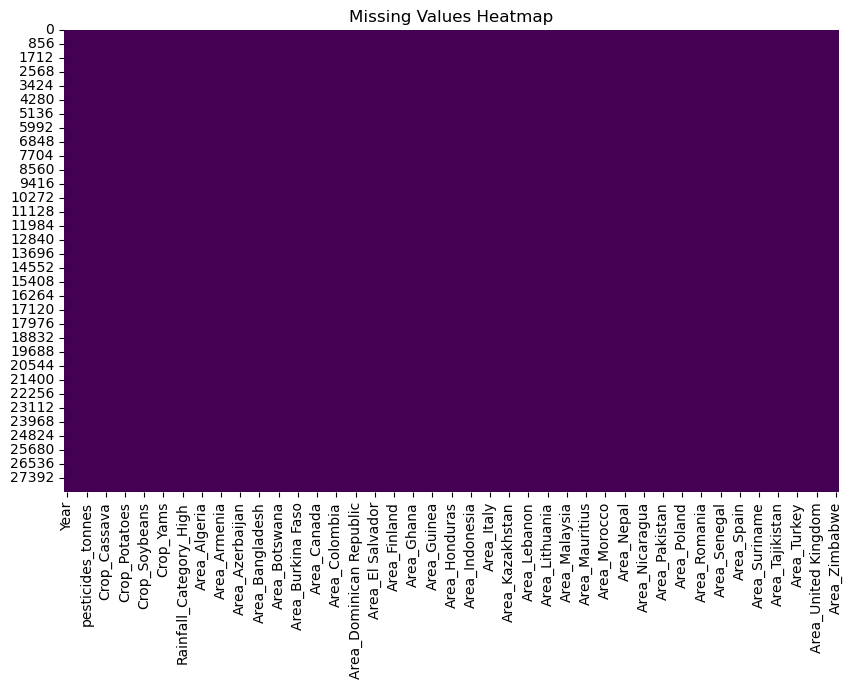

In [ ]:
import pandas as pd


missing_values = yield_dataset.isnull().sum()

# Display missing values count for each column
print("Missing Values Count in Each Column:")
print(missing_values)

# Alternatively, you can visualize missing values using a heatmap
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
sns.heatmap(df.isnull(), cbar=False, cmap='viridis')
plt.title('Missing Values Heatmap')
plt.show()

Handling Catagorical Data:

I already convert all the catagorical data like area and item to numerical values using  one hot encoding

Feature Scaling:

I also use Feauture scaling like Min-Max scaling to convert values like area and item into binary values i.e true or false / 1
or 0. So, it easy for model to make accurate prediction.

Splitting the dataset into Training and Test data:

In [ ]:
from sklearn.model_selection import train_test_split


# Define the features (X) and the target variable (y)
features = df.drop(['hg/ha_yield'], axis=1)  # Exclude the target variable
target = df['hg/ha_yield']

# Split the data into training and testing sets (80% training, 20% testing)
X_train, X_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42)

# Display the shape of the resulting sets
print("Training set shape:", X_train.shape, y_train.shape)
print("Testing set shape:", X_test.shape, y_test.shape)

Training set shape: (22593, 120) (22593,)
Testing set shape: (5649, 120) (5649,)


# Model Selection:

As I already identfied which techniques i will be using So, In this step i am using applying all the model in this step:

Library Implementation:

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error, r2_score
import plotly.express as px


Linear RegressioN Model:

In [ ]:

# Linear Regression
linear_reg_model = LinearRegression()
linear_reg_model.fit(X_train, y_train)
y_pred_linear = linear_reg_model.predict(X_test)

# Evaluation Metrics
linear_acc_train = linear_reg_model.score(X_train, y_train) * 100
linear_acc_test = linear_reg_model.score(X_test, y_test) * 100

linear_results = {
    'Model': 'Linear Regression',
    'Accuracy (Train)': linear_acc_train,
    'Accuracy (Test)': linear_acc_test,
    'MSE': mean_squared_error(y_test, y_pred_linear),
    'R2 Score': r2_score(y_test, y_pred_linear)
}

# Print Results
print("Linear Regression Results:")
print(linear_results)

# Visualizations
data_linear = {'y_test': y_test, 'y_pred': y_pred_linear}
fig_linear = px.scatter(data_linear, x='y_test', y='y_pred', labels={'x': 'Actual Values', 'y': 'Predicted Values'},
                        trendline='ols', trendline_color_override='red', template='plotly_dark',
                        title='Linear Regression Results')
fig_linear.show()




Linear Regression Results:
{'Model': 'Linear Regression', 'Accuracy (Train)': 75.63272967288009, 'Accuracy (Test)': 75.5060053007491, 'MSE': 0.007068295589808598, 'R2 Score': 0.7550600530074909}


Random Forest Model:

In [ ]:
# Random Forest
random_forest_model = RandomForestRegressor(random_state=42)
random_forest_model.fit(X_train, y_train)
y_pred_forest = random_forest_model.predict(X_test)

forest_acc_train = random_forest_model.score(X_train, y_train) * 100
forest_acc_test = random_forest_model.score(X_test, y_test) * 100

forest_results = {
    'Model': 'Random Forest',
    'Accuracy (Train)': forest_acc_train,
    'Accuracy (Test)': forest_acc_test,
    'MSE': mean_squared_error(y_test, y_pred_forest),
    'R2 Score': r2_score(y_test, y_pred_forest)
}

print("\nRandom Forest Results:")
print(forest_results)

#Visualization
data_forest = {'y_test': y_test, 'y_pred': y_pred_forest}
fig_forest = px.scatter(data_forest, x='y_test', y='y_pred', labels={'x': 'Actual Values', 'y': 'Predicted Values'},
                        trendline='ols', trendline_color_override='red', template='plotly_dark',
                        title='Random Forest Results')
fig_forest.show()



Random Forest Results:
{'Model': 'Random Forest', 'Accuracy (Train)': 99.82006002558295, 'Accuracy (Test)': 98.68886408692849, 'MSE': 0.0003783578916299232, 'R2 Score': 0.9868886408692848}


Gradient Boosting Model:

In [ ]:

# Gradient Boosting
gradient_boosting_model = GradientBoostingRegressor(random_state=42)
gradient_boosting_model.fit(X_train, y_train)
y_pred_gradient_boosting = gradient_boosting_model.predict(X_test)


gb_acc_train = gradient_boosting_model.score(X_train, y_train) * 100
gb_acc_test = gradient_boosting_model.score(X_test, y_test) * 100


gb_results = {
    'Model': 'Gradient Boosting',
    'Accuracy (Train)': gb_acc_train,
    'Accuracy (Test)': gb_acc_test,
    'MSE': mean_squared_error(y_test, y_pred_gradient_boosting),
    'R2 Score': r2_score(y_test, y_pred_gradient_boosting)
}

data_gb = {'y_test': y_test, 'y_pred': y_pred_gradient_boosting}

print("\nGradient Boosting Results:")
print(gb_results)

fig_gb = px.scatter(data_gb, x='y_test', y='y_pred', labels={'x': 'Actual Values', 'y': 'Predicted Values'},
                    trendline='ols', trendline_color_override='red', template='plotly_dark',
                    title='Gradient Boosting Results')
fig_gb.show()


Gradient Boosting Results:
{'Model': 'Gradient Boosting', 'Accuracy (Train)': 88.02245888570202, 'Accuracy (Test)': 88.00793982661526, 'MSE': 0.003460579912628421, 'R2 Score': 0.8800793982661526}


Decision Tree Model:

In [ ]:
# Decision Tree
decision_tree_model = DecisionTreeRegressor(random_state=42)
decision_tree_model.fit(X_train, y_train)
y_pred_decision_tree = decision_tree_model.predict(X_test)

dt_acc_train = decision_tree_model.score(X_train, y_train) * 100
dt_acc_test = decision_tree_model.score(X_test, y_test) * 100

dt_results = {
    'Model': 'Decision Tree',
    'Accuracy (Train)': dt_acc_train,
    'Accuracy (Test)': dt_acc_test,
    'MSE': mean_squared_error(y_test, y_pred_decision_tree),
    'R2 Score': r2_score(y_test, y_pred_decision_tree)
}

print("\nDecision Tree Results:")
print(dt_results)

# Visualizations

data_dt = {'y_test': y_test, 'y_pred': y_pred_decision_tree}
fig_dt = px.scatter(data_dt, x='y_test', y='y_pred', labels={'x': 'Actual Values', 'y': 'Predicted Values'},
                    trendline='ols', trendline_color_override='red', template='plotly_dark',
                    title='Decision Tree Results')
fig_dt.show()




Decision Tree Results:
{'Model': 'Decision Tree', 'Accuracy (Train)': 100.0, 'Accuracy (Test)': 97.69179478192905, 'MSE': 0.0006660847674537565, 'R2 Score': 0.9769179478192905}


# Training Data:

I have already train my data in model implementation as I use fit( ) on my model for training and testing my dataset .Now based
on that my model is ready to make prediction on new data based on the result from this test and train of this dataset.

# Training,Testing and Validation:

I split my dataset into train and test data in datapreprocessing step and then in Model Implementation step
I have already done training using fit( )for X_train,y_train,For testing I implement models which use train data to make
predicitons to X_test.Also I have Use Evaluation Matrix for accuracy,Mean-Squared Error.I also use plots to Make Regression Lines more clear

# Validation:

Now I need to do validation for checking how well a dataset perform on the new data.I will use K-Fold Cross validation for my
models because it split the dataset into k subsets and on each subset it perfrom testing and training.Bascially it increase
model efficency as it picks splits dataset and on each indivual dataset it perform this So, overall increase model effieceny.Also
it helps to check wheather or not model is overfitting or underfitting data.

In [ ]:
from sklearn.model_selection import KFold, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor

# Assuming df is your DataFrame and the target variable is 'target'
X = df.drop('hg/ha_yield', axis=1)
y = df['hg/ha_yield']

# Specify the models
linear_model = LinearRegression()
random_forest_model = RandomForestRegressor()
decision_tree_model = DecisionTreeRegressor()
gradient_boost_model = GradientBoostingRegressor()

# Create a list of models
models = [linear_model, random_forest_model, decision_tree_model, gradient_boost_model]

# Specify the number of folds
num_folds = 10

# Perform k-fold cross-validation for each model
for model in models:
    kfold = KFold(n_splits=num_folds, shuffle=True, random_state=42)
    scores = cross_val_score(model, X, y, cv=kfold)

    # Display the cross-validation scores for each fold
    print(f"{model.__class__.__name__}")
    for i, score in enumerate(scores, 1):
        print(f"Fold {i}: {score}")

    # Display the mean score
    mean_score = scores.mean()
    print(f"Mean Score: {mean_score}")
    print("=" * 30)

LinearRegression
Fold 1: 0.7547741659178524
Fold 2: 0.7546522686761903
Fold 3: 0.7701924299064343
Fold 4: 0.7599439429372856
Fold 5: 0.7553010791372738
Fold 6: 0.7489939977913149
Fold 7: 0.7564582247791473
Fold 8: 0.7489999876530559
Fold 9: 0.7445530155854249
Fold 10: 0.7385928169457074
Mean Score: 0.7532461929329688
RandomForestRegressor
Fold 1: 0.989524348217967
Fold 2: 0.9869894444344202
Fold 3: 0.9896758996233666
Fold 4: 0.9860991241516797
Fold 5: 0.9871882708405288
Fold 6: 0.9896658140352211
Fold 7: 0.9899763917765555
Fold 8: 0.9897661815988287
Fold 9: 0.9890472224965958
Fold 10: 0.9865033294070541
Mean Score: 0.9884436026582216
DecisionTreeRegressor
Fold 1: 0.9829822110999117
Fold 2: 0.9765336870011229
Fold 3: 0.9839488770562278
Fold 4: 0.976120697330373
Fold 5: 0.9726166102915291
Fold 6: 0.9794842083050365
Fold 7: 0.9787804238118728
Fold 8: 0.9786989703071096
Fold 9: 0.9853714040611782
Fold 10: 0.9752049812947927
Mean Score: 0.9789742070559155
GradientBoostingRegressor
Fold 1: 0

# Matric Discussion:

As my dataset deals with regression matric  where The dataset predicted continouos values i.e yield .So, The best matrices for
regression task is
Mean Squared Error (MSE):
R2-Score:
Also In some case if i want to apply accuracy which is classificatio task but if we provide some threshold we can actually use
accuracy for yield production also.
Accuracy:

All the Matrices are calculated as well with model implementation.

Accuracy: How well the model predicts the correct category (e.g., high or low crop yield).
MSE: Measures the average squared difference between predicted and actual values, giving an idea of the overall prediction error.
R2 Score: Indicates the proportion of the variance in the dependent variable that is predictable from the independent variables.

# Plots:

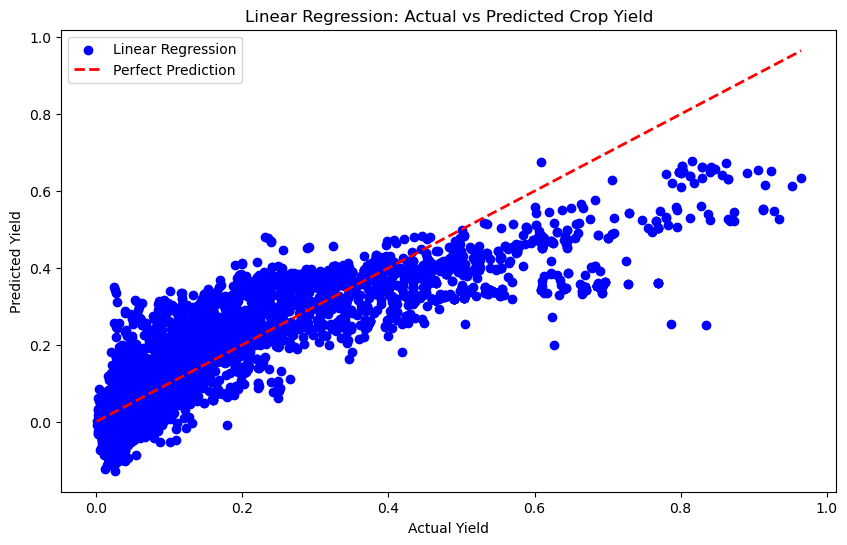

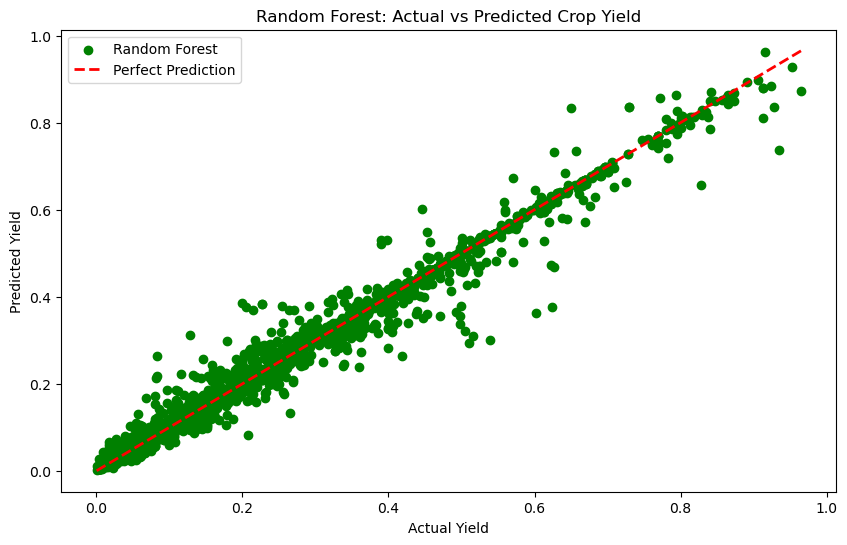

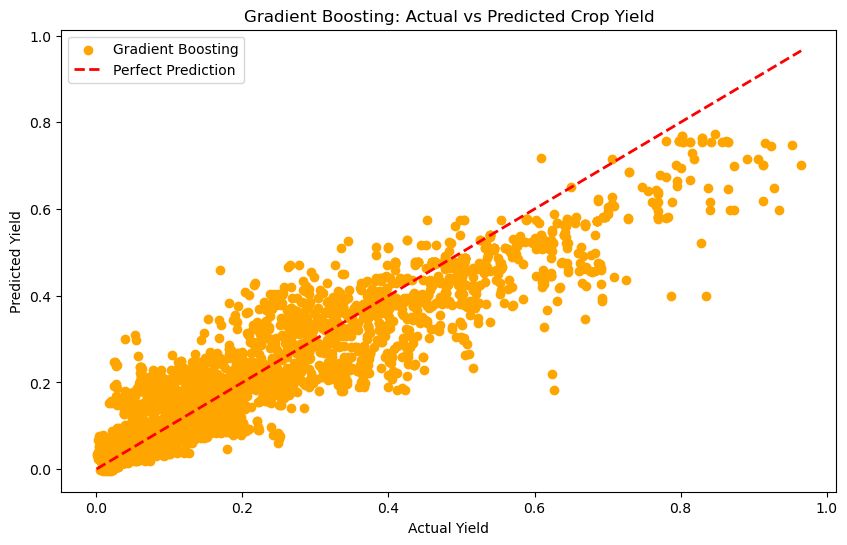

In [ ]:
import matplotlib.pyplot as plt


# Scatter plot for Linear Regression
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_linear, color='blue', label='Linear Regression')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', linewidth=2, label='Perfect Prediction')
plt.title('Linear Regression: Actual vs Predicted Crop Yield')
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.legend()
plt.show()

# Scatter plot for Random Forest
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_forest, color='green', label='Random Forest')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', linewidth=2, label='Perfect Prediction')
plt.title('Random Forest: Actual vs Predicted Crop Yield')
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.legend()
plt.show()

# Scatter plot for Gradient Boosting
plt.figure(figsize=(10, 6))
plt.scatter(y_test, y_pred_gradient_boosting, color='orange', label='Gradient Boosting')
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red', linewidth=2, label='Perfect Prediction')
plt.title('Gradient Boosting: Actual vs Predicted Crop Yield')
plt.xlabel('Actual Yield')
plt.ylabel('Predicted Yield')
plt.legend()
plt.show()

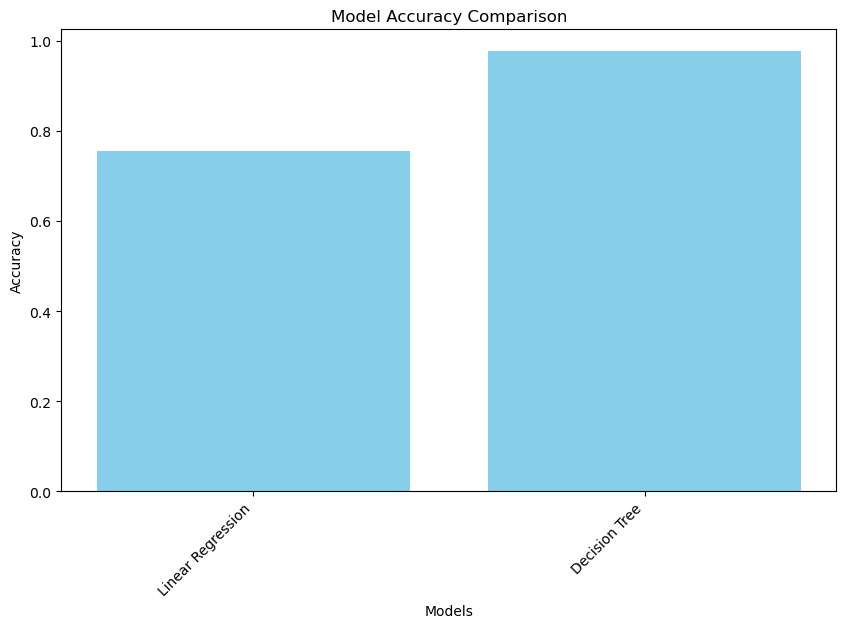

In [ ]:
import matplotlib.pyplot as plt

# Assuming 'results' is a list containing metrics for each model
# Example: results = [('Linear Regression', accuracy_linear, mse_linear, mae_linear, mape_linear, r2_linear), ...]
model_names, accuracies, mses, maes, mapes, r2_scores = zip(*results)

# Create a DataFrame
results_df = pd.DataFrame({
    'Model': model_names,
    'Accuracy': accuracies
})

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(results_df['Model'], results_df['Accuracy'], color='skyblue')
plt.xlabel('Models')
plt.ylabel('Accuracy')
plt.title('Model Accuracy Comparison')
plt.xticks(rotation=45, ha='right')
plt.show()

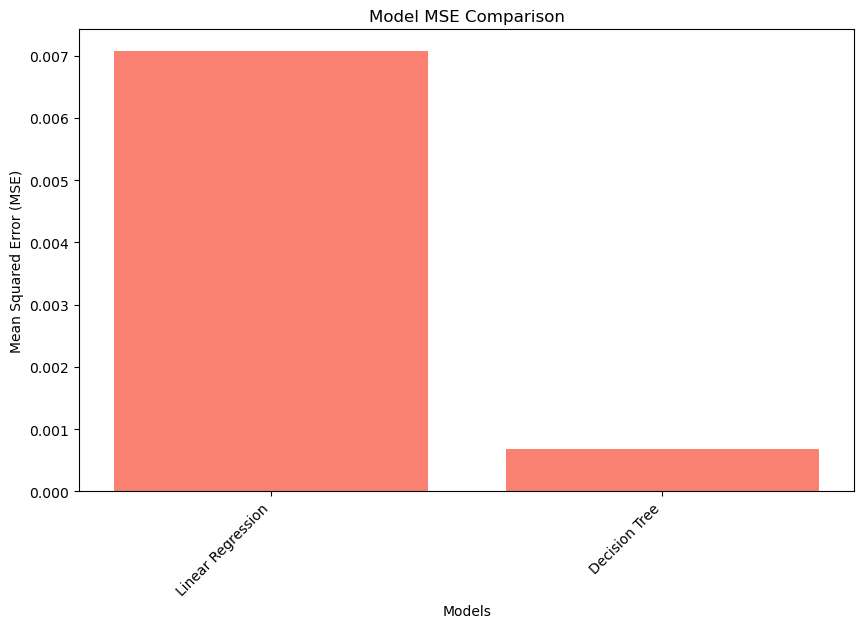

In [ ]:
# Assuming 'results' is a list containing metrics for each model
# Example: results = [('Linear Regression', accuracy_linear, mse_linear, mae_linear, mape_linear, r2_linear), ...]
model_names, accuracies, mses, maes, mapes, r2_scores = zip(*results)

# Create a DataFrame
results_df = pd.DataFrame({
    'Model': model_names,
    'MSE': mses
})

# Plotting
plt.figure(figsize=(10, 6))
plt.bar(results_df['Model'], results_df['MSE'], color='salmon')
plt.xlabel('Models')
plt.ylabel('Mean Squared Error (MSE)')
plt.title('Model MSE Comparison')
plt.xticks(rotation=45, ha='right')
plt.show()

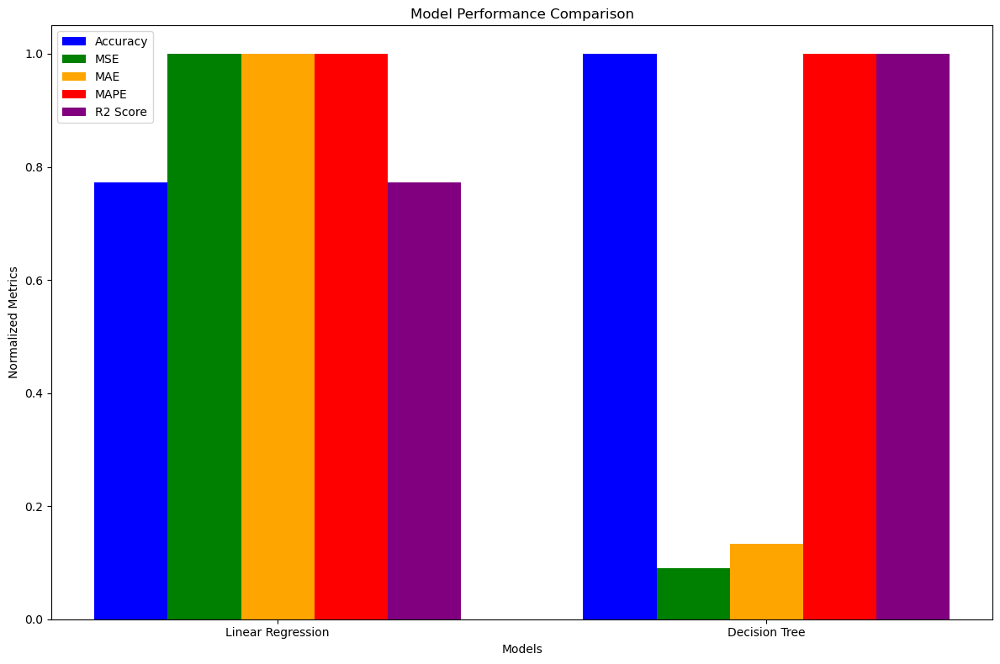

In [ ]:
import matplotlib.pyplot as plt
import numpy as np


model_names, accuracies, mses, maes, mapes, r2_scores = zip(*results)

# Normalize the metrics for better visualization
max_values = np.max([accuracies, mses, maes, mapes, r2_scores], axis=1)
accuracies /= max_values[0]
mses /= max_values[1]
maes /= max_values[2]
mapes /= max_values[3]
r2_scores /= max_values[4]

bar_width = 0.15
index = np.arange(len(model_names))

plt.figure(figsize=(12, 8))

plt.bar(index, accuracies, width=bar_width, label='Accuracy', color='blue')
plt.bar(index + bar_width, mses, width=bar_width, label='MSE', color='green')
plt.bar(index + 2 * bar_width, maes, width=bar_width, label='MAE', color='orange')
plt.bar(index + 3 * bar_width, mapes, width=bar_width, label='MAPE', color='red')
plt.bar(index + 4 * bar_width, r2_scores, width=bar_width, label='R2 Score', color='purple')

plt.xlabel('Models')
plt.ylabel('Normalized Metrics')
plt.title('Model Performance Comparison')
plt.xticks(index + 2 * bar_width, model_names)
plt.legend()

plt.tight_layout()
plt.show()